In [1]:
ENV["LINES"] = 200
ENV["COLUMNS"] = 200
using Distributions
using Roots
using StatsPlots
default(fmt=:png)

In [2]:
logoddsrat(p0, p1) = (log(p0) - log(1-p0)) - (log(p1) - log(1-p1))
logcprat(p0, p1) = -(log(1-p0) - log(1-p1))
loglikrat(k, n, p0, p1) = loglikelihood(Binomial(n, p0), k) - loglikelihood(Binomial(n, p1), k)
lim_k_C(C, n, p0, p1) = (log(C) + n*logcprat(p0, p1)) / logoddsrat(p0, p1)

function alpha_k_C(k_C, n, p0, p1)
    bin0 = Binomial(n, p0)
    p0 < p1 && return ccdf(bin0, floor(Int, k_C))
    p0 > p1 && return cdf(bin0, ceil(Int, k_C)-1)
    NaN
end

alpha_C(C, n, p0, p1) = alpha_k_C(lim_k_C(C, n, p0, p1), n, p0, p1)

r(x) = round(x; sigdigits=4)

function sim_likrat_test_C(C, n, p0, p1; p=p0, niters=10^7)
    logC = log(C)
    bin = Binomial(n, p)
    c = zeros(Int, Threads.nthreads())
    Threads.@threads for i in 1:niters
        tid = Threads.threadid()
        k = rand(bin)
        @inbounds c[tid] += loglikrat(k, n, p0, p1) < logC
    end
    sum(c)/niters
end

function sim_likrat_test_k_C(k_C, n, p0, p1; p=p0, niters=10^7)
    bin = Binomial(n, p)
    c = zeros(Int, Threads.nthreads())
    Threads.@threads for i in 1:niters
        tid = Threads.threadid()
        k = rand(bin)
        c[tid] += p0 < p1 ? k > k_C : p0 > p1 ? k < k_C : NaN
    end
    sum(c)/niters
end

function sim_likrat_test_alpha(α, n, p0, p1; p=p0, niters=10^7)
    bin0 = Binomial(n, p0)
    bin = Binomial(n, p)
    c = zeros(Int, Threads.nthreads())
    Threads.@threads for i in 1:niters
        tid = Threads.threadid()
        k = rand(bin)
        c[tid] += p0 < p1 ? ccdf(bin0, k) < α : p0 > p1 ? cdf(bin0, k-1) < α : NaN
    end
    sum(c)/niters
end

sim_likrat_test_alpha (generic function with 1 method)

In [3]:
n = 100
p0 = 0.3
p1 = 0.5

alphas = [(k_C, alpha_k_C(k_C, n, p0, p1)) for k_C in 35:40]
@show collect(zip(first.(alphas), r.(last.(alphas))))

println()

C = 2.0
@show C
@show alpha_C(C, n, p0, p1) |> r
@show sim_likrat_test_C(C, n, p0, p1)

println()

@show k_C = lim_k_C(C, n, p0, p1) |> r
@show alpha_k_C(k_C, n, p0, p1) |> r
@show sim_likrat_test_k_C(k_C, n, p0, p1)

println()

@show α = 0.0339
@show sim_likrat_test_alpha(α, n, p0, p1)
@show sim_likrat_test_alpha(α, n, p0, p1; p=0.4)
@show sim_likrat_test_alpha(α, n, p0, p1; p=0.5)
;

collect(zip(first.(alphas), r.(last.(alphas)))) = [(35, 0.1161), (36, 0.07988), (37, 0.05305), (38, 0.03398), (39, 0.02099), (40, 0.0125)]

C = 2.0
alpha_C(C, n, p0, p1) |> r = 0.03398
sim_likrat_test_C(C, n, p0, p1) = 0.0340413

k_C = lim_k_C(C, n, p0, p1) |> r = 38.89
alpha_k_C(k_C, n, p0, p1) |> r = 0.03398
sim_likrat_test_k_C(k_C, n, p0, p1) = 0.033994

α = 0.0339 = 0.0339
sim_likrat_test_alpha(α, n, p0, p1) = 0.0340513
sim_likrat_test_alpha(α, n, p0, p1; p = 0.4) = 0.6179832
sim_likrat_test_alpha(α, n, p0, p1; p = 0.5) = 0.9895475


In [4]:
n = 100
p0 = 0.3
p1 = 0.1

alphas = [(k_C, alpha_k_C(k_C, n, p0, p1)) for k_C in 20:25]
@show collect(zip(first.(alphas), r.(last.(alphas))))

println()

C = 100.0
@show C
@show alpha_C(C, n, p0, p1) |> r
@show sim_likrat_test_C(C, n, p0, p1)

println()

@show k_C = lim_k_C(C, n, p0, p1) |> r
@show alpha_k_C(k_C, n, p0, p1) |> r
@show sim_likrat_test_k_C(k_C, n, p0, p1)

println()

@show α = 0.0478
@show sim_likrat_test_alpha(α, n, p0, p1)
@show sim_likrat_test_alpha(α, n, p0, p1; p=0.2)
@show sim_likrat_test_alpha(α, n, p0, p1; p=0.1)
;

collect(zip(first.(alphas), r.(last.(alphas)))) = [(20, 0.008887), (21, 0.01646), (22, 0.02883), (23, 0.04787), (24, 0.07553), (25, 0.1136)]

C = 100.0
alpha_C(C, n, p0, p1) |> r = 0.04787
sim_likrat_test_C(C, n, p0, p1) = 0.0478994

k_C = lim_k_C(C, n, p0, p1) |> r = 22.03
alpha_k_C(k_C, n, p0, p1) |> r = 0.04787
sim_likrat_test_k_C(k_C, n, p0, p1) = 0.0479211

α = 0.0478 = 0.0478
sim_likrat_test_alpha(α, n, p0, p1) = 0.0480746
sim_likrat_test_alpha(α, n, p0, p1; p = 0.2) = 0.7388528
sim_likrat_test_alpha(α, n, p0, p1; p = 0.1) = 0.9998866


In [5]:
n = 100
p0 = 0.3

alphas = [(C, p1, alpha_C(C, n, p0, p1)) for C in (0.1, 0.33, 1.0, 3.0, 10.0, 30.0, 100.0), p1 in (0.31, 0.4, 0.5, 0.6, 0.7)]

7×5 Matrix{Tuple{Float64, Float64, Float64}}:
 (0.1, 0.31, 7.0635e-25)  (0.1, 0.4, 0.0124984)   (0.1, 0.5, 0.00396779)   (0.1, 0.6, 0.000255833)   (0.1, 0.7, 3.56148e-6)
 (0.33, 0.31, 4.9323e-7)  (0.33, 0.4, 0.0530456)  (0.33, 0.5, 0.00717356)  (0.33, 0.6, 0.000537015)  (0.33, 0.7, 9.03469e-6)
 (1.0, 0.31, 0.450876)    (1.0, 0.4, 0.162858)    (1.0, 0.5, 0.0209886)    (1.0, 0.6, 0.00108575)    (1.0, 0.7, 2.20609e-5)
 (3.0, 0.31, 1.0)         (3.0, 0.4, 0.289281)    (3.0, 0.5, 0.033979)     (3.0, 0.6, 0.00211462)    (3.0, 0.7, 2.20609e-5)
 (10.0, 0.31, 1.0)        (10.0, 0.4, 0.53766)    (10.0, 0.5, 0.07988)     (10.0, 0.6, 0.00396779)   (10.0, 0.7, 5.18595e-5)
 (30.0, 0.31, 1.0)        (30.0, 0.4, 0.703634)   (30.0, 0.5, 0.116079)    (30.0, 0.6, 0.00717356)   (30.0, 0.7, 0.000117378)
 (100.0, 0.31, 1.0)       (100.0, 0.4, 0.88643)   (100.0, 0.5, 0.162858)   (100.0, 0.6, 0.0124984)   (100.0, 0.7, 0.000117378)

In [6]:
n = 100
p0 = 0.3

alphas = [(C, p1, alpha_C(C, n, p0, p1)) for C in (0.1, 0.33, 1.0, 3.0, 10.0, 30.0, 100.0), p1 in (0.25, 0.20, 0.15, 0.10, 0.05)]

7×5 Matrix{Tuple{Float64, Float64, Float64}}:
 (0.1, 0.25, 0.00452264)  (0.1, 0.2, 0.0164629)   (0.1, 0.15, 0.00888721)  (0.1, 0.1, 0.000968865)  (0.1, 0.05, 5.65497e-5)
 (0.33, 0.25, 0.0755308)  (0.33, 0.2, 0.0478657)  (0.33, 0.15, 0.0164629)  (0.33, 0.1, 0.00216293)  (0.33, 0.05, 0.000157341)
 (1.0, 0.25, 0.296366)    (1.0, 0.2, 0.11357)     (1.0, 0.15, 0.0288313)   (1.0, 0.1, 0.00452264)   (1.0, 0.05, 0.000157341)
 (3.0, 0.25, 0.633108)    (3.0, 0.2, 0.224399)    (3.0, 0.15, 0.0755308)   (3.0, 0.1, 0.00888721)   (3.0, 0.05, 0.000405)
 (10.0, 0.25, 0.92012)    (10.0, 0.2, 0.46234)    (10.0, 0.15, 0.11357)    (10.0, 0.1, 0.0164629)   (10.0, 0.05, 0.000405)
 (30.0, 0.25, 0.987502)   (30.0, 0.2, 0.633108)   (30.0, 0.15, 0.16313)    (30.0, 0.1, 0.0288313)   (30.0, 0.05, 0.000968865)
 (100.0, 0.25, 0.999463)  (100.0, 0.2, 0.779258)  (100.0, 0.15, 0.296366)  (100.0, 0.1, 0.0478657)  (100.0, 0.05, 0.000968865)

In [7]:
p0 = 0.3
C = 2.0

@show p0, C
alphas = [(n, p1, alpha_C(C, n, p0, p1)) for n in (10, 30, 100, 300, 1000, 3000, 10000), p1 in (0.301, 0.4, 0.5, 0.6, 0.7)]

(p0, C) = (0.3, 2.0)


7×5 Matrix{Tuple{Int64, Float64, Float64}}:
 (10, 0.301, 1.0)         (10, 0.4, 0.850692)        (10, 0.5, 0.350389)        (10, 0.6, 0.350389)         (10, 0.7, 0.150268)
 (30, 0.301, 1.0)         (30, 0.4, 0.568482)        (30, 0.5, 0.159322)        (30, 0.6, 0.0844701)        (30, 0.7, 0.0169373)
 (100, 0.301, 1.0)        (100, 0.4, 0.220742)       (100, 0.5, 0.033979)       (100, 0.6, 0.00108575)      (100, 0.7, 2.20609e-5)
 (300, 0.301, 1.0)        (300, 0.4, 0.0458525)      (300, 0.5, 0.000225743)    (300, 0.6, 5.90053e-8)      (300, 0.7, 3.48966e-13)
 (1000, 0.301, 1.0)       (1000, 0.4, 0.000603704)   (1000, 0.5, 4.17403e-11)   (1000, 0.6, 8.4544e-23)     (1000, 0.7, 6.06609e-40)
 (3000, 0.301, 1.0)       (3000, 0.4, 5.38001e-9)    (3000, 0.5, 8.07985e-30)   (3000, 0.6, 2.30466e-64)    (3000, 0.7, 6.67991e-116)
 (10000, 0.301, 0.99896)  (10000, 0.4, 4.79764e-26)  (10000, 0.5, 6.04776e-95)  (10000, 0.6, 1.09198e-209)  (10000, 0.7, 0.0)

In [8]:
p0 = 0.3
C = 10.0

@show p0, C
alphas = [(n, p1, alpha_C(C, n, p0, p1)) for n in (10, 30, 100, 300, 1000, 3000, 10000), p1 in (0.301, 0.4, 0.5, 0.6, 0.7)]

(p0, C) = (0.3, 10.0)


7×5 Matrix{Tuple{Int64, Float64, Float64}}:
 (10, 0.301, 1.0)     (10, 0.4, 1.0)             (10, 0.5, 0.850692)        (10, 0.6, 0.617217)         (10, 0.7, 0.350389)
 (30, 0.301, 1.0)     (30, 0.4, 0.923405)        (30, 0.5, 0.411191)        (30, 0.6, 0.159322)         (30, 0.7, 0.0400525)
 (100, 0.301, 1.0)    (100, 0.4, 0.53766)        (100, 0.5, 0.07988)        (100, 0.6, 0.00396779)      (100, 0.7, 5.18595e-5)
 (300, 0.301, 1.0)    (300, 0.4, 0.116317)       (300, 0.5, 0.000542917)    (300, 0.6, 1.12066e-7)      (300, 0.7, 8.16703e-13)
 (1000, 0.301, 1.0)   (1000, 0.4, 0.00149832)    (1000, 0.5, 9.92459e-11)   (1000, 0.6, 3.01147e-22)    (1000, 0.7, 1.41679e-39)
 (3000, 0.301, 1.0)   (3000, 0.4, 1.32491e-8)    (3000, 0.5, 1.9118e-29)    (3000, 0.6, 4.34487e-64)    (3000, 0.7, 1.55916e-115)
 (10000, 0.301, 1.0)  (10000, 0.4, 1.17486e-25)  (10000, 0.5, 1.42957e-94)  (10000, 0.6, 2.05762e-209)  (10000, 0.7, 0.0)

In [9]:
chareq(a, b, p, t) = t==1 ? p*(a+b)-b : (p*t^a - 1 + (1-p)*t^(-b)) / (t-1)

function sol_chareq(a, b, p; alg=A42())
    f(t) = chareq(a, b, p, t)
    if p < b/(a+b)
        find_zero(f, (1.0, 1e6), alg)
    elseif p > b/(a+b)
        find_zero(f, (1e-6, 1.0), alg)
    else
        one(p)
    end
end

probapprox(p, q) = q ≤ 1/2 ? p ≈ q : 1-p ≈ 1-q

function prob_ge_M(a, b, p, M, N, x=0; alg=A42())
    probapprox(p, b/(a+b)) && return N/(M+N)
    λ = sol_chareq(a, b, p; alg)
    (λ^(x+N) - 1) / (λ^(M+N) - 1)
end

function random_walk(a, b, p, M, N, x=0.0; nmax=10^3)
    X = Float64[]
    (a ≤ 0 || b ≤ 0) && return X
    for n in 1:nmax
        x += rand() < p ? a : -b
        push!(X, x)
        (x ≤ -N || M ≤ x) && return X
    end
    X
end

function sim_random_walks(a, b, p, M, N, x=0.0; nmax=10^3, niters=10^4)
    X = Vector{Vector{Float64}}(undef, niters)
    for i in 1:niters
        X[i] = random_walk(a, b, p, M, N, x; nmax)
    end
    X, last.(X)
end

function _abp(p0, p1, p_true)
    logOR, logA = logoddsrat(p0, p1), logcprat(p0, p1)
    if p0 == p1
        a, b, p = 0.0, 0.0, p_true
    elseif p0 < p1 # logOR < logA < 0
        a, b, p = -logA, logA-logOR, 1-p_true
    else  # 0 < logA < logOR
        a, b, p = logOR-logA, logA, p_true
    end
    a, b, p
end

_MN(C0, C1) = log(C1), -log(C0)

function _abpMN(p0, p1, p_true, C0, C1)
    a, b, p = _abp(p0, p1, p_true)
    M, N = _MN(C0, C1)
    a, b, p, M, N
end

function prob_accept(p0, p1, p_true, C0, C1)
    p0 == p1 && return NaN
    a, b, p, M, N = _abpMN(p0, p1, p_true, C0, C1)
    prob_ge_M(a, b, p, M, N)
end

function random_likrat_test(p0, p1, p_true, C0, C1; nmax=10^3)
    logC0, logC1 = log(C0), log(C1)
    LLR = Float64[]
    k =0
    for n in 1:nmax
        k += rand(Bernoulli(p_true))
        llr = loglikrat(k, n, p0, p1)
        push!(LLR, llr)
        (llr ≤ logC0 || logC1 ≤ llr) && return LLR
    end
    LLR
end

function sim_likrat_tests(p0, p1, p_true, C0, C1; nmax=10^3, niters=10^4)
    LLR = Vector{Vector{Float64}}(undef, niters)
    for i in 1:niters
        LLR[i] = random_likrat_test(p0, p1, p_true, C0, C1; nmax)
    end
    LLR, last.(LLR), length.(LLR)
end

sim_likrat_tests (generic function with 1 method)

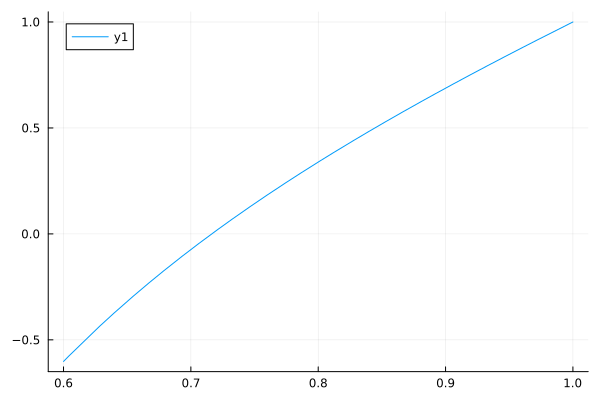

In [10]:
a, b, p = 3, 2, 0.6
plot(t -> chareq(a, b, p, t), 0.6, 1)

In [11]:
#??find_zero

a = 0.4
b = 0.5
p = 0.55
M = 5
N = 5
prob_ge_M(a, b, p, M, N) = 0.43787213592106555
  0.428831 seconds (596.00 k allocations: 317.826 MiB, 37.68% gc time, 19.29% compilation time)
alpha1 = mean(lastX .≥ M) = 0.43507
alpha0 = mean(lastX .≤ -N) = 0.56493
alpha1 + alpha0 = 1.0


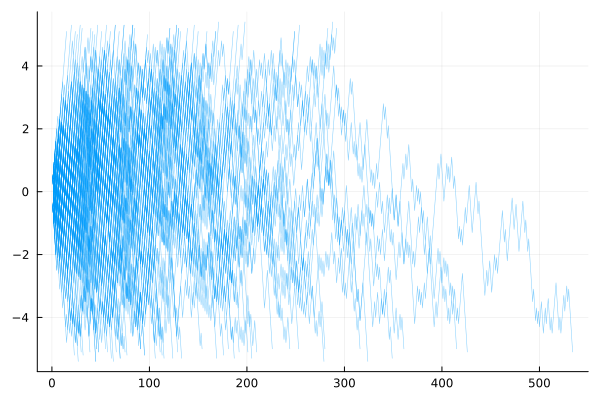

In [12]:
a, b, p, M, N = 0.4, 0.5, 0.55, 5, 5
@show a b p M N
@show prob_ge_M(a, b, p, M, N)
@time X, lastX = sim_random_walks(a, b, p, M, N; nmax=10^4, niters=10^5)
@show alpha1 = mean(lastX .≥ M)
@show alpha0 = mean(lastX .≤ -N)
@show alpha1 + alpha0

plot()
for i in 1:100
    plot!(X[i]; label="", c=1, lw=0.5, alpha=0.5)
end
plot!()

p0 = 0.3
p1 = 0.5
p = 0.3
C0 = 0.1
C1 = 10
logC0 = -2.3025850929940455
logC1 = 2.302585092994046
prob_accept(p0, p1, p, C0, C1) = 0.9090909090909087
  0.142318 seconds (178.18 k allocations: 14.366 MiB, 67.38% compilation time)
mean(lenLLR) = 25.025
std(lenLLR) = 17.687177802743506
alpha1 = mean(lastLLR .≥ logC1) = 0.9272
alpha0 = mean(lastLLR .≤ logC0) = 0.0728
alpha1 + alpha0 = 1.0


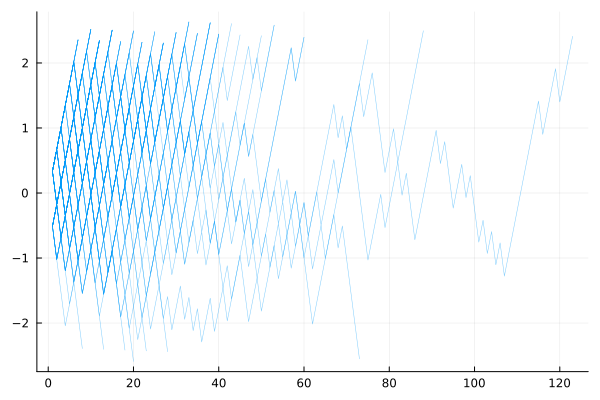

In [13]:
p0, p1, p, C0, C1 = 0.3, 0.5, 0.3, 1/10, 10
logC0, logC1 = log(C0), log(C1)
@show p0 p1 p C0 C1 logC0 logC1
@show prob_accept(p0, p1, p, C0, C1)
@time LLR, lastLLR, lenLLR = sim_likrat_tests(p0, p1, p, C0, C1; nmax=10^3, niters=10^4)
@show mean(lenLLR) std(lenLLR)
@show alpha1 = mean(lastLLR .≥ logC1)
@show alpha0 = mean(lastLLR .≤ logC0)
@show alpha1 + alpha0

plot()
for i in 1:100
    plot!(LLR[i]; label="", c=1, lw=0.5, alpha=0.5)
end
plot!()

p0 = 0.3
p1 = 0.4
p = 0.3
C0 = 0.0625
C1 = 16
logC0 = -2.772588722239781
logC1 = 2.772588722239781
prob_accept(p0, p1, p, C0, C1) = 0.9411764705882345
  0.213932 seconds (42.47 k allocations: 27.461 MiB)
mean(lenLLR) = 117.6111
std(lenLLR) = 83.58693877887526
alpha1 = mean(lastLLR .≥ logC1) = 0.948
alpha0 = mean(lastLLR .≤ logC0) = 0.052
alpha1 + alpha0 = 1.0


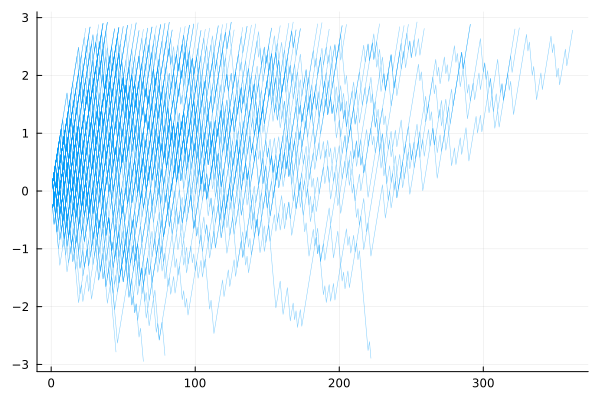

In [14]:
p0, p1, p, C0, C1 = 0.3, 0.4, 0.3, 1/16, 16
logC0, logC1 = log(C0), log(C1)
@show p0 p1 p C0 C1 logC0 logC1
@show prob_accept(p0, p1, p, C0, C1)
@time LLR, lastLLR, lenLLR = sim_likrat_tests(p0, p1, p, C0, C1; nmax=10^3, niters=10^4)
@show mean(lenLLR) std(lenLLR)
@show alpha1 = mean(lastLLR .≥ logC1)
@show alpha0 = mean(lastLLR .≤ logC0)
@show alpha1 + alpha0

plot()
for i in 1:100
    plot!(LLR[i]; label="", c=1, lw=0.5, alpha=0.5)
end
plot!()

(p0, p1, p_true, C0, C1) = (0.3, 0.5, 0.3, 0.1, 10)
(logC0, logC1) = (-2.3025850929940455, 2.302585092994046)
prob_accept(p0, p1, p_true, C0, C1) = 0.9090909090909087
  0.047227 seconds (30.55 k allocations: 6.758 MiB)
mean(lenLLR) = 25.041
std(lenLLR) = 18.134624491853867
alpha1 = mean(lastLLR .≥ logC1) = 0.9247
alpha0 = mean(lastLLR .≤ logC0) = 0.0753
alpha1 + alpha0 = 1.0


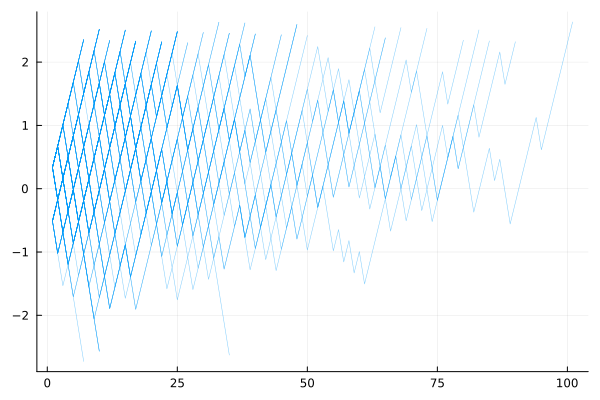

In [15]:
p0, p1, p_true, C0, C1 = 0.3, 0.5, 0.3, 1/10, 10
logC0, logC1 = log(C0), log(C1)
@show p0, p1, p_true, C0, C1
@show logC0, logC1
@show prob_accept(p0, p1, p_true, C0, C1)
@time LLR, lastLLR, lenLLR = sim_likrat_tests(p0, p1, p, C0, C1; nmax=10^3, niters=10^4)
@show mean(lenLLR) std(lenLLR)
@show alpha1 = mean(lastLLR .≥ logC1)
@show alpha0 = mean(lastLLR .≤ logC0)
@show alpha1 + alpha0

plot()
for i in 1:100
    plot!(LLR[i]; label="", c=1, lw=0.5, alpha=0.5)
end
plot!()

(p0, p1, p_true, C0, C1) = (0.3, 0.4, 0.3, 0.05, 10)
(logC0, logC1) = (-2.995732273553991, 2.302585092994046)
prob_accept(p0, p1, p_true, C0, C1) = 0.9547738693467329
  0.182073 seconds (40.55 k allocations: 23.442 MiB)
mean(lenLLR) = 98.6435
std(lenLLR) = 75.29169072094982
alpha1 = mean(lastLLR .≥ logC1) = 0.9606
alpha0 = mean(lastLLR .≤ logC0) = 0.0394
alpha1 + alpha0 = 1.0


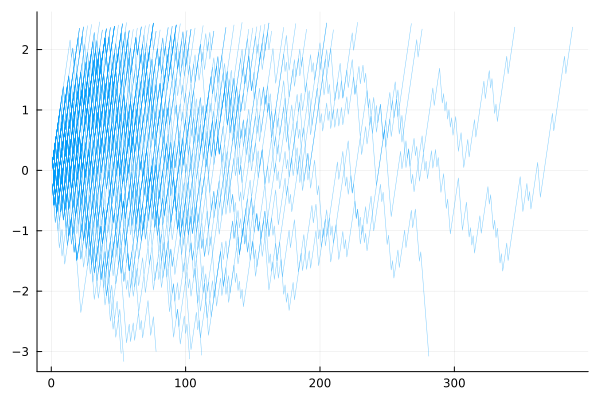

In [16]:
p0, p1, p_true, C0, C1 = 0.3, 0.4, 0.3, 1/20, 10
logC0, logC1 = log(C0), log(C1)
@show p0, p1, p_true, C0, C1
@show logC0, logC1
@show prob_accept(p0, p1, p_true, C0, C1)
@time LLR, lastLLR, lenLLR = sim_likrat_tests(p0, p1, p, C0, C1; nmax=10^3, niters=10^4)
@show mean(lenLLR) std(lenLLR)
@show alpha1 = mean(lastLLR .≥ logC1)
@show alpha0 = mean(lastLLR .≤ logC0)
@show alpha1 + alpha0

plot()
for i in 1:100
    plot!(LLR[i]; label="", c=1, lw=0.5, alpha=0.5)
end
plot!()

(p0, p1, p_true, C0, C1) = (0.5, 0.3, 0.3, 0.1, 16)
(logC0, logC1) = (-2.3025850929940455, 2.772588722239781)
prob_accept(p0, p1, p_true, C0, C1) = 0.05660377358490581
  0.051112 seconds (30.85 k allocations: 7.075 MiB)
mean(lenLLR) = 26.1329
std(lenLLR) = 19.24902828973478
alpha1 = mean(lastLLR .≥ logC1) = 0.0456
alpha0 = mean(lastLLR .≤ logC0) = 0.9544
alpha1 + alpha0 = 1.0


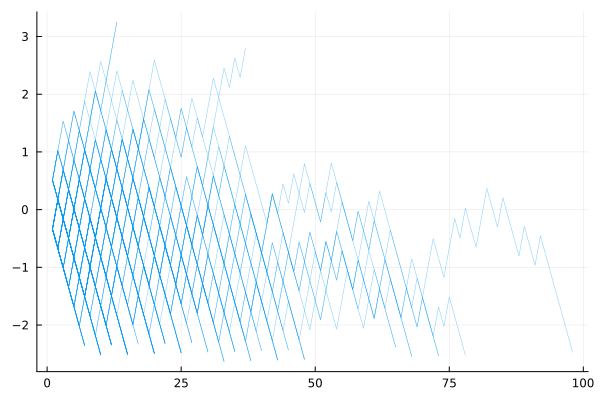

In [17]:
p0, p1, p_true, C0, C1 = 0.5, 0.3, 0.3, 1/10, 16
logC0, logC1 = log(C0), log(C1)
@show p0, p1, p_true, C0, C1
@show logC0, logC1
@show prob_accept(p0, p1, p_true, C0, C1)
@time LLR, lastLLR, lenLLR = sim_likrat_tests(p0, p1, p, C0, C1; nmax=10^3, niters=10^4)
@show mean(lenLLR) std(lenLLR)
@show alpha1 = mean(lastLLR .≥ logC1)
@show alpha0 = mean(lastLLR .≤ logC0)
@show alpha1 + alpha0

plot()
for i in 1:100
    plot!(LLR[i]; label="", c=1, lw=0.5, alpha=0.5)
end
plot!()

In [18]:
p0, p1, p_true = 0.3, 0.6, 0.6
p = p0 < p1 ? 1-p_true : p_true
a = p0 < p1 ? log(1-p0)-log(1-p1) : log(p0)-log(p1)
b = p0 < p1 ? log(p1)-log(p0) : log(1-p1)-log(1-p0)
@show exp(a), exp(-b), p
λ = sol_chareq(a, b, p)
@show λ, 1/λ

@show p*λ^a + (1-p)*λ^(-b)
;

(exp(a), exp(-b), p) = (1.7499999999999998, 0.49999999999999994, 0.4)
(λ, 1 / λ) = (2.718281828459047, 0.3678794411714421)
p * λ ^ a + (1 - p) * λ ^ -b = 1.0


In [19]:
p0, p1, p_true = 0.7, 0.3, 0.3
p = p0 < p1 ? 1-p_true : p_true
a = p0 < p1 ? log(1-p0)-log(1-p1) : log(p0)-log(p1)
b = p0 < p1 ? log(p1)-log(p0) : log(1-p1)-log(1-p0)
λ = sol_chareq(a, b, p)
@show λ, 1/λ
;

(λ, 1 / λ) = (2.7182818284590446, 0.3678794411714424)


(α, β) = (0.05, 0.2) = (0.05, 0.2)
(M, N) = (log((1 - α) / (1 - β)), log(β / α)) = (0.17185025692665903, 1.3862943611198906)
((exp(-N) - 1) / (exp(-M - N) - 1), (exp(N) - 1) / (exp(M + N) - 1)) = (0.95, 0.8000000000000002)
(p0, p1, p_true, C0, C1) = (0.3, 0.35, 0.3, 0.25, 1.1874999999999998)
(logC0, logC1) = (-1.3862943611198906, 0.17185025692665903)
prob_accept(p0, p1, p_true, C0, C1) = 0.9499999999999995
  0.105275 seconds (59.37 k allocations: 7.434 MiB, 64.46% compilation time)
mean(lenLLR) = 20.8429
std(lenLLR) = 32.83995532665332
alpha1 = mean(lastLLR .≥ logC1) = 0.9411
alpha0 = mean(lastLLR .≤ logC0) = 0.0589
alpha1 + alpha0 = 1.0


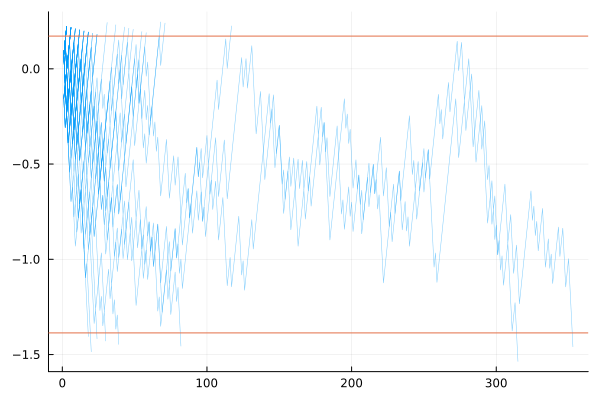

In [20]:
@show α, β = 0.05, 0.20
@show M, N = log((1-α)/(1-β)), log(β/α)
@show (exp(-N)-1)/(exp(-M-N)-1), (exp(N)-1)/(exp(M+N)-1)

p0, p1, p_true, C0, C1 = 0.3, 0.35, 0.3, α/β, (1-α)/(1-β)
logC0, logC1 = log(C0), log(C1)
@show p0, p1, p_true, C0, C1
@show logC0, logC1
@show prob_accept(p0, p1, p_true, C0, C1)
@time LLR, lastLLR, lenLLR = sim_likrat_tests(p0, p1, p_true, C0, C1; nmax=10^4, niters=10^4)
@show mean(lenLLR) std(lenLLR)
@show alpha1 = mean(lastLLR .≥ logC1)
@show alpha0 = mean(lastLLR .≤ logC0)
@show alpha1 + alpha0

plot()
for i in 1:100
    plot!(LLR[i]; label="", c=1, lw=0.5, alpha=0.5)
end
hline!([logC0, logC1]; c=2, label="")
plot!()

(α, β) = (0.05, 0.2) = (0.05, 0.2)
(M, N) = (log((1 - α) / (1 - β)), log(β / α)) = (0.17185025692665903, 1.3862943611198906)
((exp(-N) - 1) / (exp(-M - N) - 1), (exp(N) - 1) / (exp(M + N) - 1)) = (0.95, 0.8000000000000002)
(p0, p1, p_true, C0, C1) = (0.3, 0.35, 0.35, 0.25, 1.1874999999999998)
(logC0, logC1) = (-1.3862943611198906, 0.17185025692665903)
prob_accept(p0, p1, p_true, C0, C1) = 0.7999999999999993
  0.058440 seconds (28.92 k allocations: 8.010 MiB)
mean(lenLLR) = 31.0317
std(lenLLR) = 40.95598166755908
alpha1 = mean(lastLLR .≥ logC1) = 0.7677
alpha0 = mean(lastLLR .≤ logC0) = 0.2323
alpha1 + alpha0 = 1.0


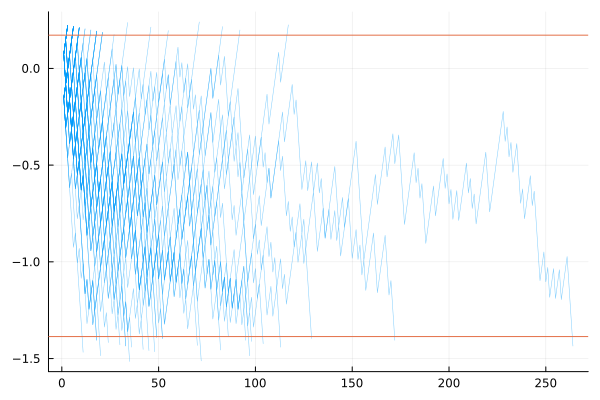

In [21]:
@show α, β = 0.05, 0.20
@show M, N = log((1-α)/(1-β)), log(β/α)
@show (exp(-N)-1)/(exp(-M-N)-1), (exp(N)-1)/(exp(M+N)-1)

p0, p1, p_true, C0, C1 = 0.3, 0.35, 0.35, α/β, (1-α)/(1-β)
logC0, logC1 = log(C0), log(C1)
@show p0, p1, p_true, C0, C1
@show logC0, logC1
@show prob_accept(p0, p1, p_true, C0, C1)
@time LLR, lastLLR, lenLLR = sim_likrat_tests(p0, p1, p_true, C0, C1; nmax=10^4, niters=10^4)
@show mean(lenLLR) std(lenLLR)
@show alpha1 = mean(lastLLR .≥ logC1)
@show alpha0 = mean(lastLLR .≤ logC0)
@show alpha1 + alpha0

plot()
for i in 1:100
    plot!(LLR[i]; label="", c=1, lw=0.5, alpha=0.5)
end
hline!([logC0, logC1]; c=2, label="")
plot!()

## 尤度比が閾値を超えるまでデータの数値を取得し続ける検定法

$
\newcommand\op{\operatorname}
$__データの数値:__ $x_1, x_2, x_3, \ldots$ (各$x_i$は$1$または$0$)

$k=x_1+x_2+\cdots+x_n$とおく.

__モデル:__ 成功率$p$のBernoulli試行

$0<p_0<1$, $0<p_1<1$, $p_0\ne p_1$と仮定する.

__帰無仮説:__ $p=p_0$

__対立仮説:__ $p=p_1$

__尤度比__: $n$番目の尤度比を次のように定める:
$$
\op{LR}_n = \frac{p_0^k(1-p_0)^{n-k}}{p_1^k(1-p_1)^{n-k}}.
$$

__閾値の設定:__ $0<\alpha<1$, $0<\beta<1$, $\alpha+\beta<1$と仮定し, 次のようにおく:
$$
C_0 = \frac{\alpha}{1-\beta}, \quad
C_1 = \frac{1-\alpha}{\beta}.
$$

__判定法:__ $i=1,2,\ldots,n-1$について$C_0\le\op{LR}_i\le C_1$となり, $i=n$で(初めて)そうならなかったとき,

* $\op{LR}_n < C_0$ならば帰無仮説$p=p_0$を棄却する.
* $\op{LR}_n > C_1$ならば対立仮説$p=p_1$を棄却する.

__αエラー率とβエラー率__

* データの数値が帰無仮説$p=p_0$の下でのモデルの確率分布で生成されているとき, 帰無仮説が棄却される確率は$\alpha$で近似される.
* データの数値が帰無仮説$p=p_1$の下でのモデルの確率分布で生成されているとき, 対立仮説が棄却される確率は$\beta$で近似される.

In [22]:
function plot_tests(; α=0.05, β=0.20, p0=0.3, p1=0.5, p_true=0.3, cc=0.0, nmax=10^5, niters=10^5)
    @show α, β, p0, p1, p_true
    a, b, p = _abp(p0, p1, p_true)
    @show a, b, cc
    @show C0 = α/(1-β) * exp(-cc*b)
    @show C1 = (1-α)/β * exp(cc*a)
    println()
    LLR, lastLLR, lenLLR = sim_likrat_tests(p0, p1, p_true, C0, C1; nmax, niters)
    @show mean_lenLLR = mean(lenLLR)
    @show std_lenLLR = std(lenLLR)
    @show median_lenLLR = median(lenLLR)
    println()
    @show samplesize(β; p0, p1, α)
    @show power(ceil(Int, mean_lenLLR); p0, p1, α)
    println()
    @show prob_reject_H0 = mean(lastLLR .< log(C0))
    @show prob_reject_H1 = mean(lastLLR .> log(C1))
    @show prob_reject_H0 + prob_reject_H1

    plot()
    for i in 1:200
        plot!(0:length(LLR[i]), [0.0; LLR[i]]; label="", lw=1, alpha=0.3)
    end
    hline!([log(C0)]; c=:red, label="log(C0)")
    hline!([log(C1)]; c=:blue, label="log(C1)")
    plot!(legendfontsize=12)
    plot!(xguide="n", yguide="log(LRₙ)", guidefontsize=14)
    plot!(size=(800, 300))
    plot!(leftmargin=4Plots.mm, bottommargin=4Plots.mm)
end

function pvalue(k, n, p0, p1)
    if p0 == p1
        NaN
    elseif p0 < p1
        ccdf(Binomial(n, p0), k-1)
    else
        cdf(Binomial(n, p0), k)
    end
end

function hypothesis_test(k, n, p0, p1, α)
    pvalue(k, n, p0, p1) < α
end

function power(n; p0=0.3, p1=0.5, α=0.05)
    bin1 = Binomial(n, p1)
    sum(hypothesis_test(k, n, p0, p1, α) * pdf(bin1, k) for k in support(bin1))
end

function power_mc(n; p0=0.3, p1=0.5, α=0.05, niters=10^5)
    bin1 = Binomial(n, p1)
    c = 0
    for i in 1:niters
        k = rand(bin1)
        c += hypothesis_test(k, n, p0, p1, α)
    end
    c/niters
end

function samplesize(β; p0=0.3, p1=0.5, α=0.05, powerfunc=power)
    n = 1
    while !(1-β ≤ powerfunc(n; p0, p1, α) && 1-β ≤ powerfunc(n+1; p0, p1, α))
        n += 1
    end
    n
end

samplesize (generic function with 1 method)

(α, β, p0, p1, p_true) = (0.05, 0.2, 0.3, 0.5, 0.3)
(a, b, cc) = (0.33647223662121284, 0.5108256237659908, 0.0)
C0 = (α / (1 - β)) * exp(-cc * b) = 0.0625
C1 = ((1 - α) / β) * exp(cc * a) = 4.749999999999999

mean_lenLLR = mean(lenLLR) = 18.57699
std_lenLLR = std(lenLLR) = 15.44359989081807
median_lenLLR = median(lenLLR) = 13.0

samplesize(β; p0, p1, α) = 43
power(ceil(Int, mean_lenLLR); p0, p1, α) = 0.49999999999999944

prob_reject_H0 = mean(lastLLR .< log(C0)) = 0.041
prob_reject_H1 = mean(lastLLR .> log(C1)) = 0.959
prob_reject_H0 + prob_reject_H1 = 1.0


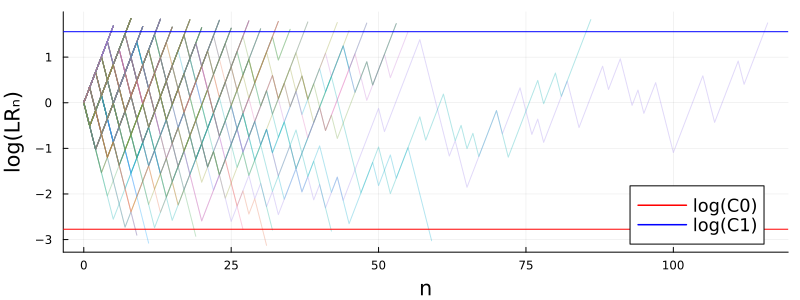


(α, β, p0, p1, p_true) = (0.05, 0.2, 0.3, 0.5, 0.5)
(a, b, cc) = (0.33647223662121284, 0.5108256237659908, 0.0)
C0 = (α / (1 - β)) * exp(-cc * b) = 0.0625
C1 = ((1 - α) / β) * exp(cc * a) = 4.749999999999999

mean_lenLLR = mean(lenLLR) = 25.2704
std_lenLLR = std(lenLLR) = 17.205278958977694
median_lenLLR = median(lenLLR) = 21.0

samplesize(β; p0, p1, α) = 43
power(ceil(Int, mean_lenLLR); p0, p1, α) = 0.577490508556367

prob_reject_H0 = mean(lastLLR .< log(C0)) = 0.82786
prob_reject_H1 = mean(lastLLR .> log(C1)) = 0.17214
prob_reject_H0 + prob_reject_H1 = 1.0


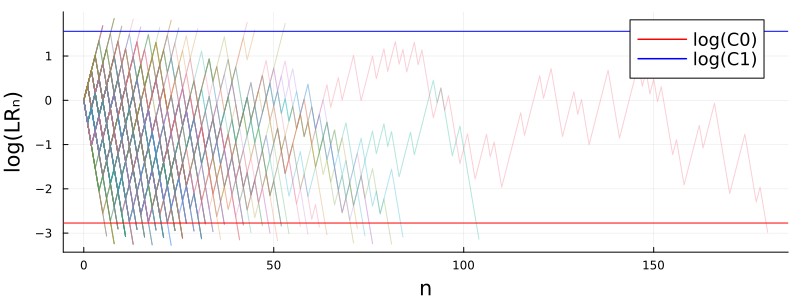

In [23]:
plot_tests(; α=0.05, β=0.20, p0=0.3, p1=0.5, p_true=0.3) |> display
println()
plot_tests(; α=0.05, β=0.20, p0=0.3, p1=0.5, p_true=0.5) |> display

(α, β, p0, p1, p_true) = (0.025, 0.2, 0.3, 0.5, 0.3)
(a, b, cc) = (0.33647223662121284, 0.5108256237659908, 0.0)
C0 = (α / (1 - β)) * exp(-cc * b) = 0.03125
C1 = ((1 - α) / β) * exp(cc * a) = 4.875

mean_lenLLR = mean(lenLLR) = 19.625
std_lenLLR = std(lenLLR) = 17.68557951544783
median_lenLLR = median(lenLLR) = 13.0

samplesize(β; p0, p1, α) = 54
power(ceil(Int, mean_lenLLR); p0, p1, α) = 0.4119014739990229

prob_reject_H0 = mean(lastLLR .< log(C0)) = 0.02038
prob_reject_H1 = mean(lastLLR .> log(C1)) = 0.97962
prob_reject_H0 + prob_reject_H1 = 1.0


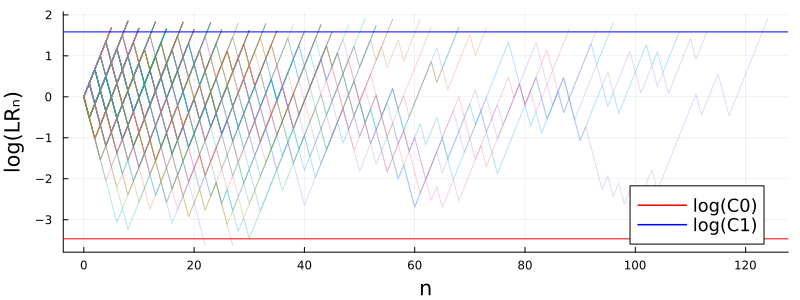


(α, β, p0, p1, p_true) = (0.025, 0.2, 0.3, 0.5, 0.5)
(a, b, cc) = (0.33647223662121284, 0.5108256237659908, 0.0)
C0 = (α / (1 - β)) * exp(-cc * b) = 0.03125
C1 = ((1 - α) / β) * exp(cc * a) = 4.875

mean_lenLLR = mean(lenLLR) = 31.65146
std_lenLLR = std(lenLLR) = 21.117056119852304
median_lenLLR = median(lenLLR) = 27.0

samplesize(β; p0, p1, α) = 54
power(ceil(Int, mean_lenLLR); p0, p1, α) = 0.5699749670457092

prob_reject_H0 = mean(lastLLR .< log(C0)) = 0.8268
prob_reject_H1 = mean(lastLLR .> log(C1)) = 0.1732
prob_reject_H0 + prob_reject_H1 = 1.0


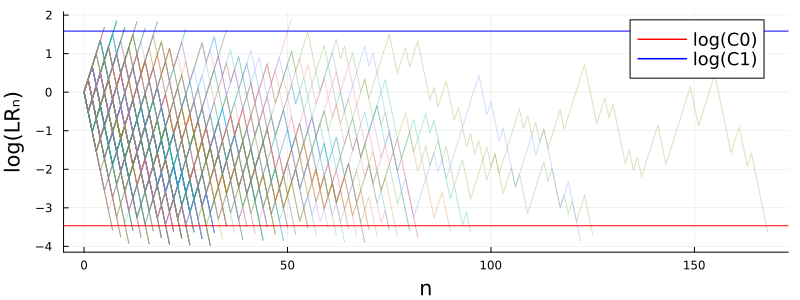

In [24]:
plot_tests(; α=0.025, β=0.20, p0=0.3, p1=0.5, p_true=0.3) |> display
println()
plot_tests(; α=0.025, β=0.20, p0=0.3, p1=0.5, p_true=0.5) |> display

(α, β, p0, p1, p_true) = (0.05, 0.2, 0.3, 0.2, 0.3)
(a, b, cc) = (0.40546510810816416, 0.13353139262452274, 0.0)
C0 = (α / (1 - β)) * exp(-cc * b) = 0.0625
C1 = ((1 - α) / β) * exp(cc * a) = 4.749999999999999

mean_lenLLR = mean(lenLLR) = 53.74621
std_lenLLR = std(lenLLR) = 48.51939263789809
median_lenLLR = median(lenLLR) = 39.0

samplesize(β; p0, p1, α) = 127
power(ceil(Int, mean_lenLLR); p0, p1, α) = 0.4730280774517256

prob_reject_H0 = mean(lastLLR .< log(C0)) = 0.05019
prob_reject_H1 = mean(lastLLR .> log(C1)) = 0.94981
prob_reject_H0 + prob_reject_H1 = 1.0


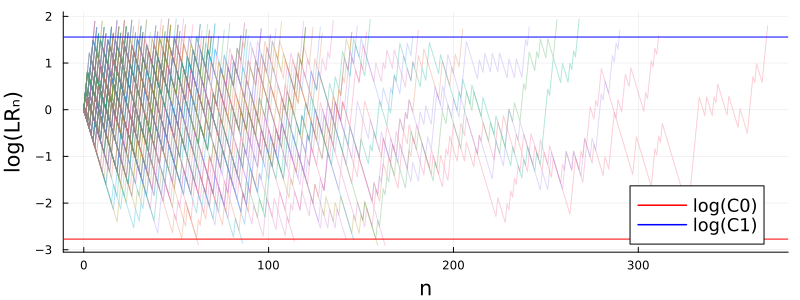


(α, β, p0, p1, p_true) = (0.05, 0.2, 0.3, 0.2, 0.2)
(a, b, cc) = (0.40546510810816416, 0.13353139262452274, 0.0)
C0 = (α / (1 - β)) * exp(-cc * b) = 0.0625
C1 = ((1 - α) / β) * exp(cc * a) = 4.749999999999999

mean_lenLLR = mean(lenLLR) = 80.50368
std_lenLLR = std(lenLLR) = 54.32307793586041
median_lenLLR = median(lenLLR) = 66.0

samplesize(β; p0, p1, α) = 127
power(ceil(Int, mean_lenLLR); p0, p1, α) = 0.6498754906485336

prob_reject_H0 = mean(lastLLR .< log(C0)) = 0.83051
prob_reject_H1 = mean(lastLLR .> log(C1)) = 0.16949
prob_reject_H0 + prob_reject_H1 = 1.0


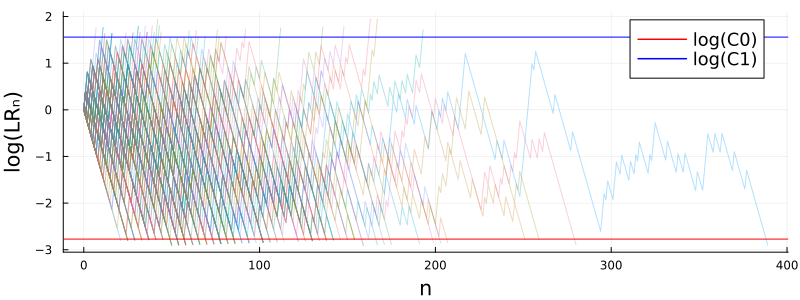

In [25]:
plot_tests(; α=0.05, β=0.20, p0=0.3, p1=0.2, p_true=0.3) |> display
println()
plot_tests(; α=0.05, β=0.20, p0=0.3, p1=0.2, p_true=0.2) |> display

(α, β, p0, p1, p_true) = (0.025, 0.2, 0.3, 0.2, 0.3)
(a, b, cc) = (0.40546510810816416, 0.13353139262452274, 0.0)
C0 = (α / (1 - β)) * exp(-cc * b) = 0.03125
C1 = ((1 - α) / β) * exp(cc * a) = 4.875

mean_lenLLR = mean(lenLLR) = 57.42502
std_lenLLR = std(lenLLR) = 55.519777939550735
median_lenLLR = median(lenLLR) = 39.0

samplesize(β; p0, p1, α) = 155
power(ceil(Int, mean_lenLLR); p0, p1, α) = 0.37019058624740975

prob_reject_H0 = mean(lastLLR .< log(C0)) = 0.02438
prob_reject_H1 = mean(lastLLR .> log(C1)) = 0.97562
prob_reject_H0 + prob_reject_H1 = 1.0


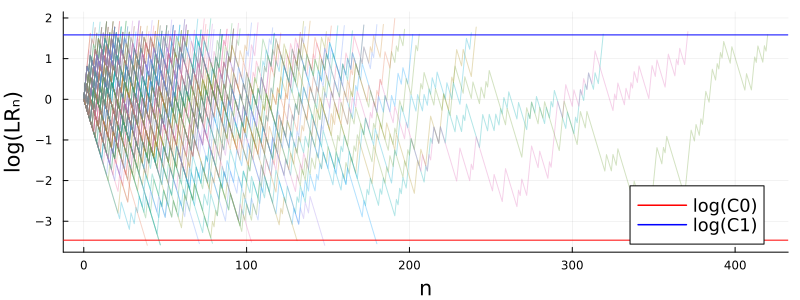


(α, β, p0, p1, p_true) = (0.025, 0.2, 0.3, 0.2, 0.2)
(a, b, cc) = (0.40546510810816416, 0.13353139262452274, 0.0)
C0 = (α / (1 - β)) * exp(-cc * b) = 0.03125
C1 = ((1 - α) / β) * exp(cc * a) = 4.875

mean_lenLLR = mean(lenLLR) = 102.78528
std_lenLLR = std(lenLLR) = 66.85338816452528
median_lenLLR = median(lenLLR) = 87.0

samplesize(β; p0, p1, α) = 155
power(ceil(Int, mean_lenLLR); p0, p1, α) = 0.5967704444168763

prob_reject_H0 = mean(lastLLR .< log(C0)) = 0.83095
prob_reject_H1 = mean(lastLLR .> log(C1)) = 0.16905
prob_reject_H0 + prob_reject_H1 = 1.0


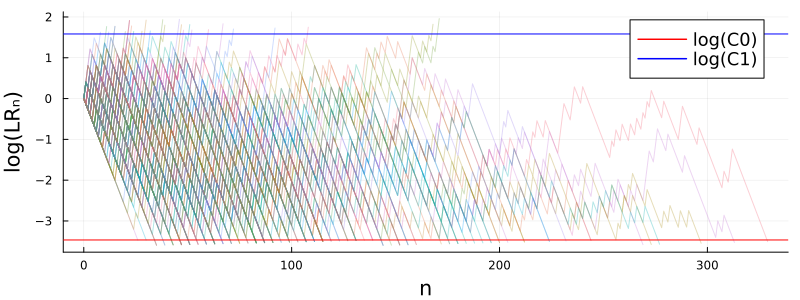

In [26]:
plot_tests(; α=0.025, β=0.20, p0=0.3, p1=0.2, p_true=0.3) |> display
println()
plot_tests(; α=0.025, β=0.20, p0=0.3, p1=0.2, p_true=0.2) |> display

(α, β, p0, p1, p_true) = (0.025, 0.2, 0.5, 0.6, 0.5)
(a, b, cc) = (0.2231435513142097, 0.18232155679395456, 0.0)
C0 = (α / (1 - β)) * exp(-cc * b) = 0.03125
C1 = ((1 - α) / β) * exp(cc * a) = 4.875

mean_lenLLR = mean(lenLLR) = 76.60301
std_lenLLR = std(lenLLR) = 72.4911729705175
median_lenLLR = median(lenLLR) = 51.0

samplesize(β; p0, p1, α) = 203
power(ceil(Int, mean_lenLLR); p0, p1, α) = 0.3839989901272918

prob_reject_H0 = mean(lastLLR .< log(C0)) = 0.02391
prob_reject_H1 = mean(lastLLR .> log(C1)) = 0.97609
prob_reject_H0 + prob_reject_H1 = 1.0


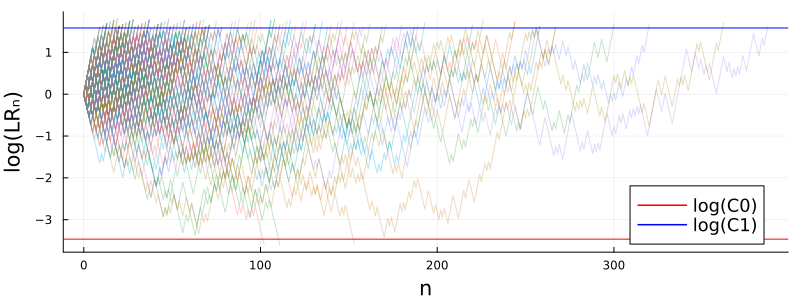


(α, β, p0, p1, p_true) = (0.025, 0.2, 0.5, 0.6, 0.6)
(a, b, cc) = (0.2231435513142097, 0.18232155679395456, 0.0)
C0 = (α / (1 - β)) * exp(-cc * b) = 0.03125
C1 = ((1 - α) / β) * exp(cc * a) = 4.875

mean_lenLLR = mean(lenLLR) = 129.23073
std_lenLLR = std(lenLLR) = 87.8554903209748
median_lenLLR = median(lenLLR) = 108.0

samplesize(β; p0, p1, α) = 203
power(ceil(Int, mean_lenLLR); p0, p1, α) = 0.6079318682179682

prob_reject_H0 = mean(lastLLR .< log(C0)) = 0.81738
prob_reject_H1 = mean(lastLLR .> log(C1)) = 0.18262
prob_reject_H0 + prob_reject_H1 = 1.0


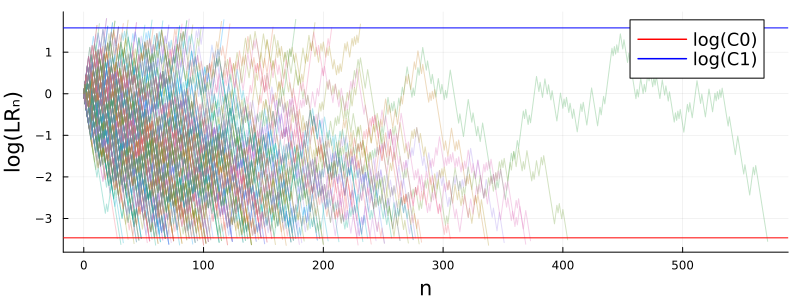

In [27]:
plot_tests(; α=0.025, β=0.20, p0=0.5, p1=0.6, p_true=0.5) |> display
println()
plot_tests(; α=0.025, β=0.20, p0=0.5, p1=0.6, p_true=0.6) |> display

(α, β, p0, p1, p_true) = (0.025, 0.2, 0.4, 0.6, 0.5)
(a, b, cc) = (0.4054651081081643, 0.4054651081081643, 0.0)
C0 = (α / (1 - β)) * exp(-cc * b) = 0.03125
C1 = ((1 - α) / β) * exp(cc * a) = 4.875

mean_lenLLR = mean(lenLLR) = 36.1383
std_lenLLR = std(lenLLR) = 33.959717103266
median_lenLLR = median(lenLLR) = 26.0

samplesize(β; p0, p1, α) = 55
power(ceil(Int, mean_lenLLR); p0, p1, α) = 0.5967981994271272

prob_reject_H0 = mean(lastLLR .< log(C0)) = 0.3081
prob_reject_H1 = mean(lastLLR .> log(C1)) = 0.6919
prob_reject_H0 + prob_reject_H1 = 1.0


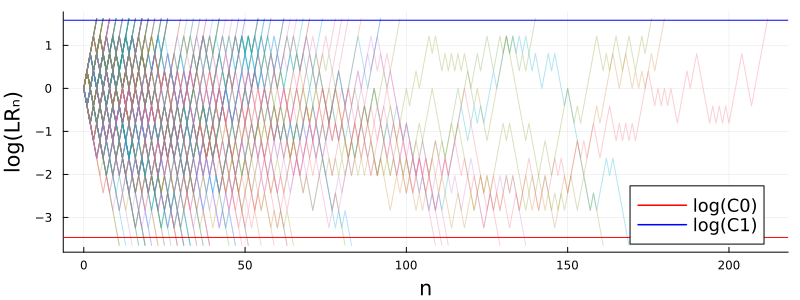


(α, β, p0, p1, p_true) = (0.025, 0.2, 0.4, 0.6, 0.6)
(a, b, cc) = (0.4054651081081643, 0.4054651081081643, 0.0)
C0 = (α / (1 - β)) * exp(-cc * b) = 0.03125
C1 = ((1 - α) / β) * exp(cc * a) = 4.875

mean_lenLLR = mean(lenLLR) = 32.37199
std_lenLLR = std(lenLLR) = 21.685439723991305
median_lenLLR = median(lenLLR) = 27.0

samplesize(β; p0, p1, α) = 55
power(ceil(Int, mean_lenLLR); p0, p1, α) = 0.5470384084221745

prob_reject_H0 = mean(lastLLR .< log(C0)) = 0.80681
prob_reject_H1 = mean(lastLLR .> log(C1)) = 0.19319
prob_reject_H0 + prob_reject_H1 = 1.0


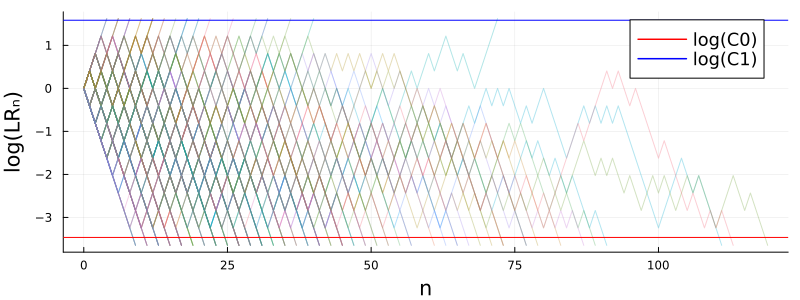

In [28]:
plot_tests(; α=0.025, β=0.20, p0=0.4, p1=0.6, p_true=0.5) |> display
println()
plot_tests(; α=0.025, β=0.20, p0=0.4, p1=0.6, p_true=0.6) |> display